In [1]:
using Distributions
using StatsPlots
default(fmt=:png, tickfontsize=6)

ECDF(A, x) = count(≤(x), A)/length(A)

function degree_of_freedom_Welchelch(m, sx², n, sy²)
    (sx²/m + sy²/n)^2 / ((sx²/m)^2/(m-1) + (sy²/n)^2/(n-1))
end

function plot_t_tests(;
        distx = Normal(),
        disty = Normal(),
        m = 10, 
        n = 10,
        s = 1,
        L = 10^6,
        ytick = 0:0.01:1,
        ylim = :auto,
        legend = :bottom
    )
    @show distx 
    @show disty
    @show m
    @show n
    @show s
    @show mean(distx)
    if s == 1 @show(mean(disty)) else @show(s*mean(disty)) end
    @show std(distx)
    if s == 1 @show(std(disty)) else @show(abs(s)*std(disty)) end
    
    X = rand(distx, m, L)
    Y = rand(disty, n, L)
    
    X̄ = mean(X; dims=1) |> vec
    Ȳ = s*mean(Y; dims=1) |> vec
    SX = std.(eachcol(X))
    SY = std.(eachcol(Y));
    S = @. √(((m-1)*SX^2 + (n-1)*SY^2)/(m+n-2))

    T_Student = @. (X̄ - Ȳ)/(S*√(1/m + 1/n))
    T_Welch = @. (X̄ - Ȳ)/√(SX^2/m + SY^2/n)
    @show T_Student ≈ T_Welch
    DF_Welch = @. degree_of_freedom_Welchelch(m, SX^2, n, SY^2)

    @show m+n-2 mean(DF_Welch) std(DF_Welch)

    pval_Student = @. 2ccdf(TDist(m+n-2), abs(T_Student))
    pval_Welch = @. 2ccdf(TDist(DF_Welch), abs(T_Welch))

    @show ECDF(pval_Student, 0.05) ECDF(pval_Welch, 0.05)
    @show ECDF(pval_Student, 0.01) ECDF(pval_Welch, 0.01)
    
    P = plot(α -> ECDF(pval_Student, α), 0, 0.1; label="Student t-test")
    plot!(α -> ECDF(pval_Welch, α), 0, 0.1; label="Welch t-test", ls=:dash)
    plot!(identity, 0, 0.1; label="", ls=:dot, c=:black)
    plot!(; xtick=0:0.01:1, ytick, xrotation=90)
    plot!(; xguide="nominal significance level α",
        yguide="probability of p-value ≤ α")
    plot!(; legend=:outertop, legendfontsize=10)

    Q = stephist(pval_Student; norm=true, label="Student t-test")
    stephist!(pval_Welch; norm=true, ls=:dash, label="Welch t-test")
    plot!(; xguide="P-value", yguide="probability density")
    plot!(; xtick=0:0.05:1, ytick=0:0.1:5, xrotation=90)
    plot!(; legend=:outertop, legendfontsize=10, ylim)
    
    plot(P, Q; size=(1000, 460), layout=@layout [a{0.4w} b])
    plot!(; bottommargin=4Plots.mm, leftmargin=4Plots.mm)
end

function plot_df_and_SEratio(;
        m = 9,
        n = 11,
        tick = Any[0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100, 200, 500, 1000]
    )
    log10tick = (tick, string.(tick))
    as = 10.0 .^ range(log10(minimum(tick)), log10(maximum(tick)), 1000)

    P = plot(as, a -> degree_of_freedom_Welchelch(m, 1, n, a); label="Welch t-test")
    hline!([(m-1)+(n-1)]; label="Student t-test", ls=:dash)
    hline!([min(m-1, n-1)]; label="min(m-1, n-1)", ls=:dashdot)
    hline!([max(m-1, n-1)]; label="max(m-1, n-1)", ls=:dashdotdot)
    vline!([(n*(n-1))/(m*(m-1))]; label="(n*(n-1))/(m*(m-1))", ls=:dot)
    plot!(xscale=:log10, xtick=log10tick)
    plot!(xguide="var(sample of X) / var(sample of Y)")
    title!("degree of freedom for m = $m, n = $n")

    Q = plot(as, a -> √(1/m + a/n) / √((((m-1)+(n-1)*a)/(m-1+n-1))*(1/m+1/n));
        label="(Welch SE)/(Student SE)")
    hline!([√(m/n), √(n/m)]; label="√(m/n), √(n/m)", ls=:dash)
    plot!(xscale=:log10, xtick=log10tick)
    plot!(xguide="var(sample of X) / var(sample of Y)")
    plot!(ylim=(0.9, 1.1) .* minmax(√(m/n), √(n/m)))
    title!("(Welch's SE) / (Student's SE) for m = $m,  n = $n")

    plot(P, Q; size=(1200, 400))
    plot!(bottommargin=4Plots.mm)
end

plot_df_and_SEratio (generic function with 1 method)

distx = Normal{Float64}(μ=0.0, σ=1.0)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 10
n = 10
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.0
std(disty) = 1.0
T_Student ≈ T_Welch = true
(m + n) - 2 = 18
mean(DF_Welch) = 16.537354613100998
std(DF_Welch) = 1.5682727351781243
ECDF(pval_Student, 0.05) = 0.049886
ECDF(pval_Welch, 0.05) = 0.048422
ECDF(pval_Student, 0.01) = 0.009963
ECDF(pval_Welch, 0.01) = 0.009322


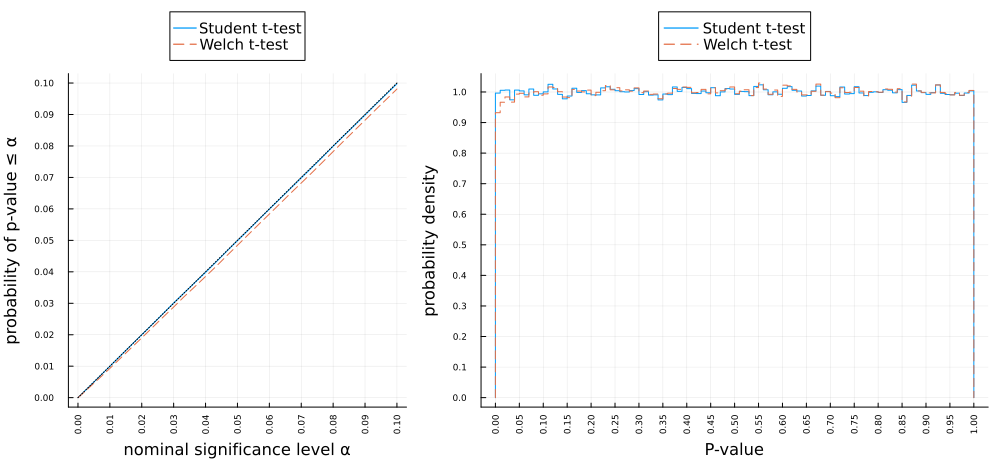

In [2]:
plot_t_tests(; distx = Normal(), disty = Normal(), m = 10, n = 10)

distx = Normal{Float64}(μ=0.0, σ=1.0)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 9
n = 11
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.0
std(disty) = 1.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 18
mean(DF_Welch) = 16.08637352571025
std(DF_Welch) = 1.922710419504092
ECDF(pval_Student, 0.05) = 0.04985
ECDF(pval_Welch, 0.05) = 0.048592
ECDF(pval_Student, 0.01) = 0.009976
ECDF(pval_Welch, 0.01) = 0.009395


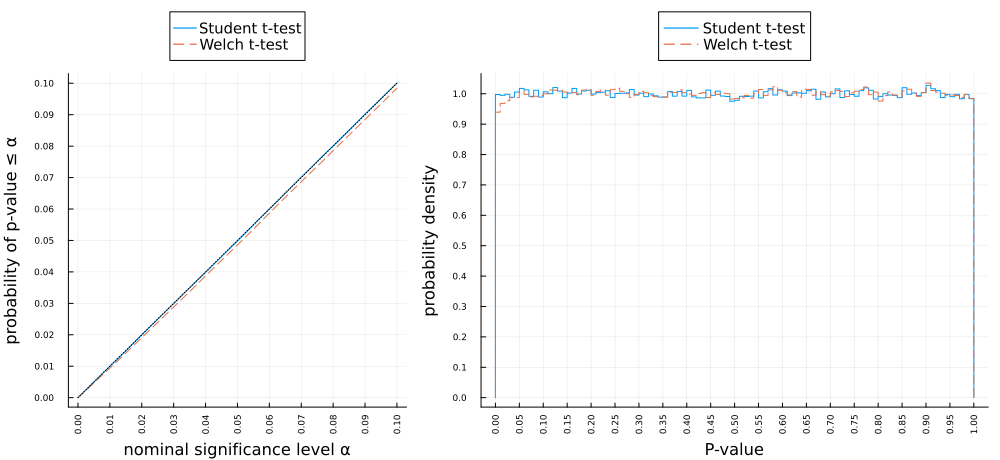

In [3]:
plot_t_tests(; distx = Normal(), disty = Normal(), m = 9, n = 11)

distx = Normal{Float64}(μ=1.3, σ=1.0)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 10
n = 10
s = 1
mean(distx) = 1.3
mean(disty) = 0.0
std(distx) = 1.0
std(disty) = 1.0
T_Student ≈ T_Welch = true
(m + n) - 2 = 18
mean(DF_Welch) = 16.535777678879747
std(DF_Welch) = 1.5702114753950265
ECDF(pval_Student, 0.05) = 0.78462
ECDF(pval_Welch, 0.05) = 0.780257
ECDF(pval_Student, 0.01) = 0.52553
ECDF(pval_Welch, 0.01) = 0.513466


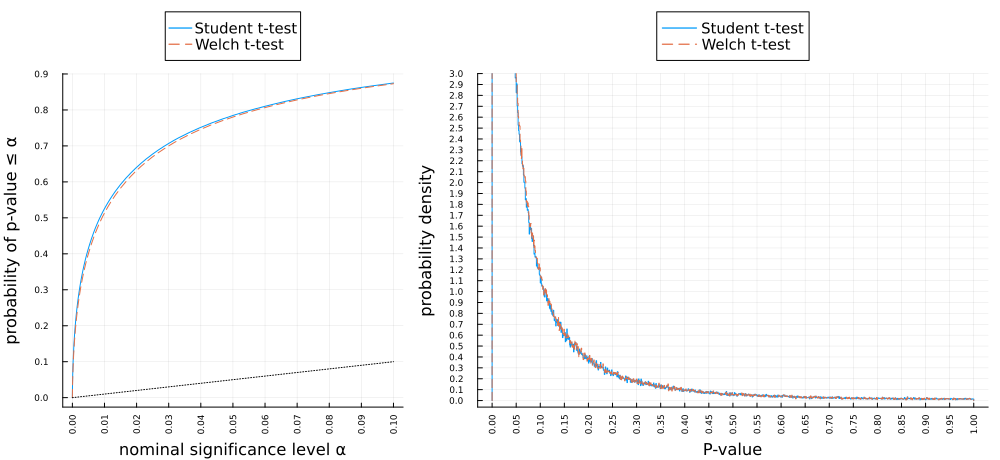

In [4]:
plot_t_tests(; distx = Normal(1.3, 1), disty = Normal(0, 1), m = 10, n = 10,
    ytick=0:0.1:1, ylim=(-0.06, 3))

distx = Normal{Float64}(μ=0.0, σ=1.0)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 8
n = 12
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.0
std(disty) = 1.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 18
mean(DF_Welch) = 14.817183988381576
std(DF_Welch) = 2.5769534616656564
ECDF(pval_Student, 0.05) = 0.049523
ECDF(pval_Welch, 0.05) = 0.048702
ECDF(pval_Student, 0.01) = 0.00994
ECDF(pval_Welch, 0.01) = 0.009696


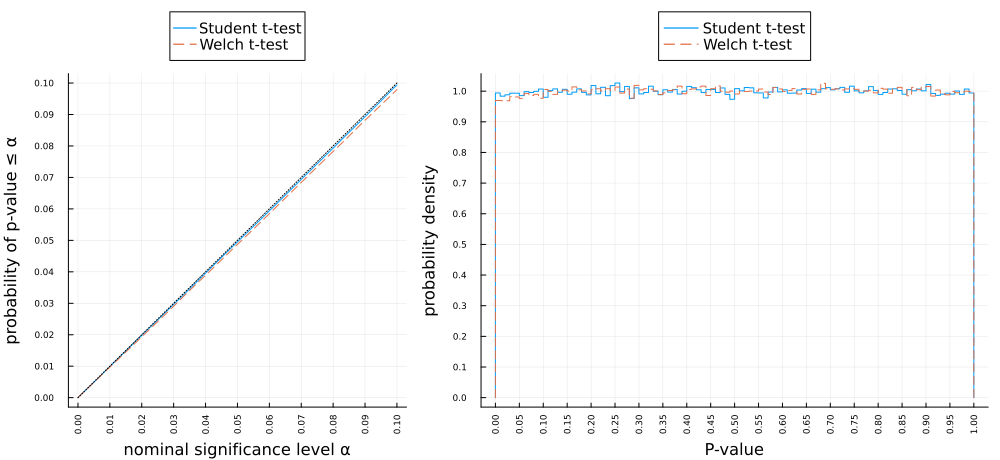

In [5]:
plot_t_tests(; distx = Normal(), disty = Normal(), m = 8, n = 12)

distx = Normal{Float64}(μ=0.0, σ=2.0)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 10
n = 10
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0
T_Student ≈ T_Welch = true
(m + n) - 2 = 18
mean(DF_Welch) = 13.543383006233894
std(DF_Welch) = 2.2043828894266118
ECDF(pval_Student, 0.05) = 0.05466
ECDF(pval_Welch, 0.05) = 0.050209
ECDF(pval_Student, 0.01) = 0.012248
ECDF(pval_Welch, 0.01) = 0.010236


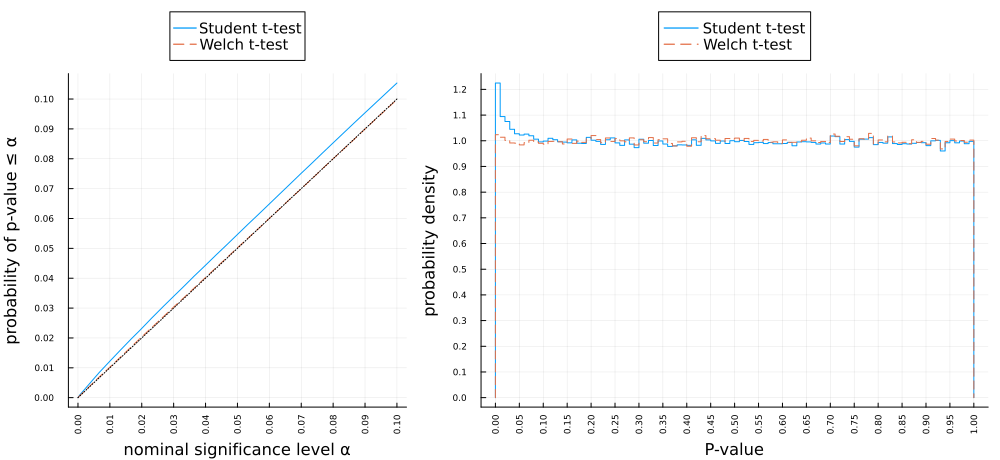

In [6]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 10, n = 10)

distx = Normal{Float64}(μ=0.0, σ=2.0)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 9
n = 11
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 18
mean(DF_Welch) = 11.8060651551956
std(DF_Welch) = 2.230167408712365
ECDF(pval_Student, 0.05) = 0.06974
ECDF(pval_Welch, 0.05) = 0.050774
ECDF(pval_Student, 0.01) = 0.017793
ECDF(pval_Welch, 0.01) = 0.010898


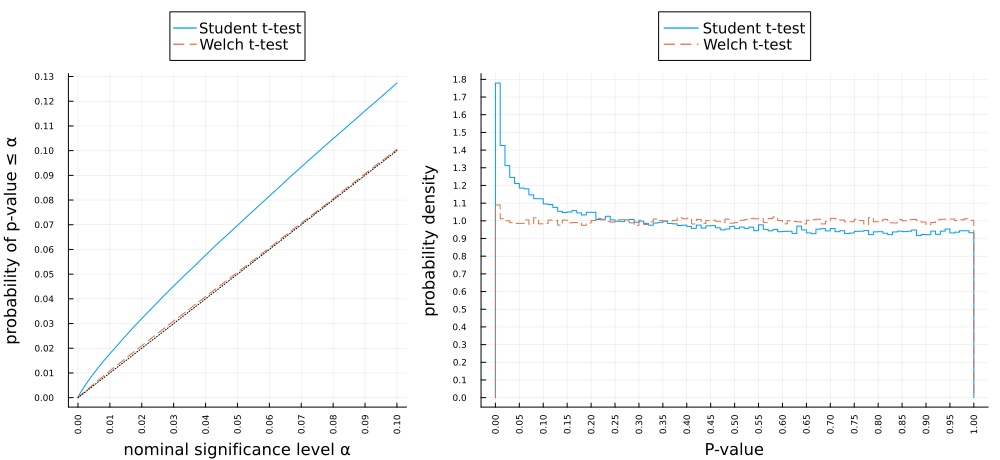

In [7]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 9, n = 11)

distx = Normal{Float64}(μ=0.0, σ=2.0)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 8
n = 12
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 18
mean(DF_Welch) = 10.047654934705667
std(DF_Welch) = 2.1134472879792536
ECDF(pval_Student, 0.05) = 0.08764
ECDF(pval_Welch, 0.05) = 0.051404
ECDF(pval_Student, 0.01) = 0.024843
ECDF(pval_Welch, 0.01) = 0.0114


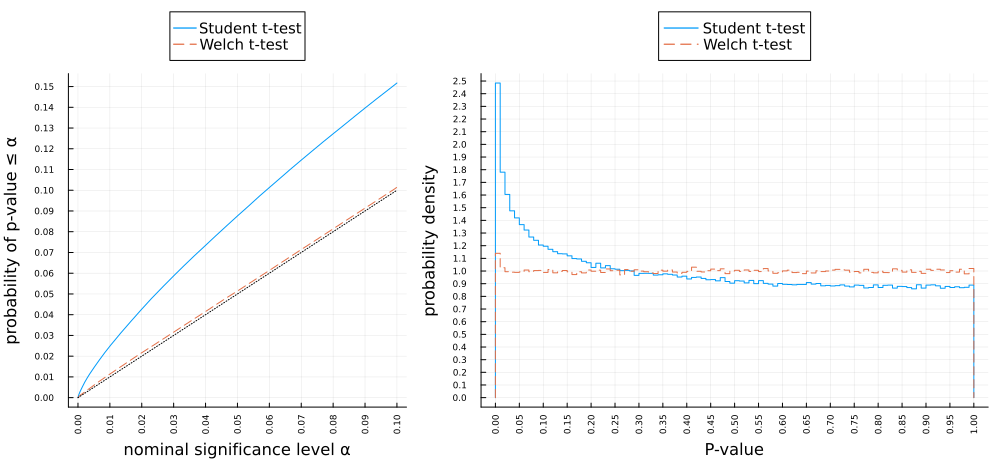

In [8]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 8, n = 12)

distx = Normal{Float64}(μ=0.0, σ=2.0)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 80
n = 120
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 198
mean(DF_Welch) = 106.23482203426319
std(DF_Welch) = 5.618916288553301
ECDF(pval_Student, 0.05) = 0.082736
ECDF(pval_Welch, 0.05) = 0.050133
ECDF(pval_Student, 0.01) = 0.022853
ECDF(pval_Welch, 0.01) = 0.010019


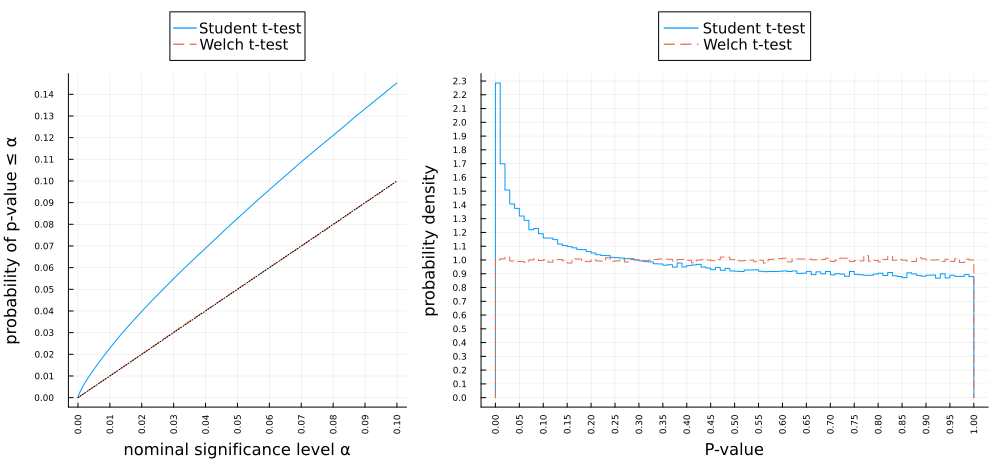

In [9]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 80, n = 120)

distx = Normal{Float64}(μ=0.0, σ=2.0)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 800
n = 1200
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 2.0
std(disty) = 1.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 1998
mean(DF_Welch) = 1068.3416624391793
std(DF_Welch) = 17.16372784090573
ECDF(pval_Student, 0.05) = 0.08212
ECDF(pval_Welch, 0.05) = 0.04966
ECDF(pval_Student, 0.01) = 0.02222
ECDF(pval_Welch, 0.01) = 0.01002


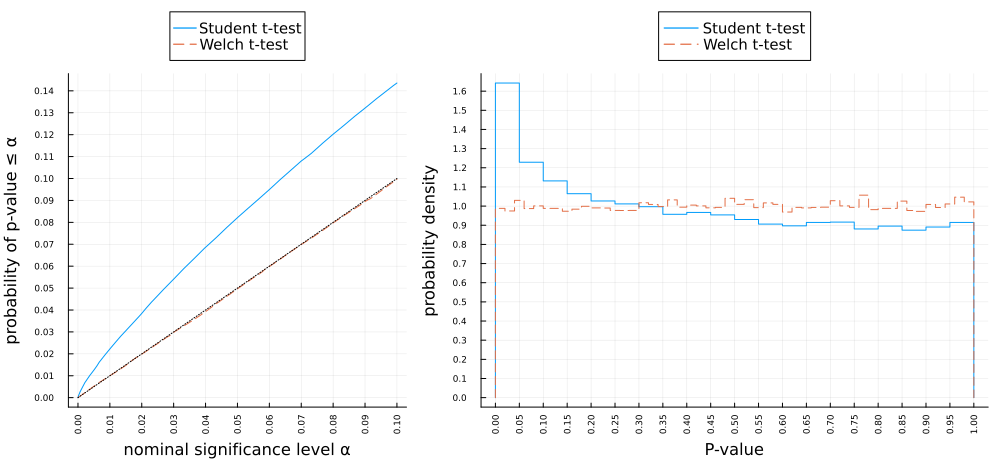

In [10]:
plot_t_tests(; distx = Normal(0, 2), disty = Normal(0, 1), m = 800, n = 1200, L = 10^5)

distx = Normal{Float64}(μ=0.0, σ=3.0)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 9
n = 11
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 3.0
std(disty) = 1.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 18
mean(DF_Welch) = 9.879281671193667
std(DF_Welch) = 1.4057544827016295
ECDF(pval_Student, 0.05) = 0.080945
ECDF(pval_Welch, 0.05) = 0.051289
ECDF(pval_Student, 0.01) = 0.023491
ECDF(pval_Welch, 0.01) = 0.011205


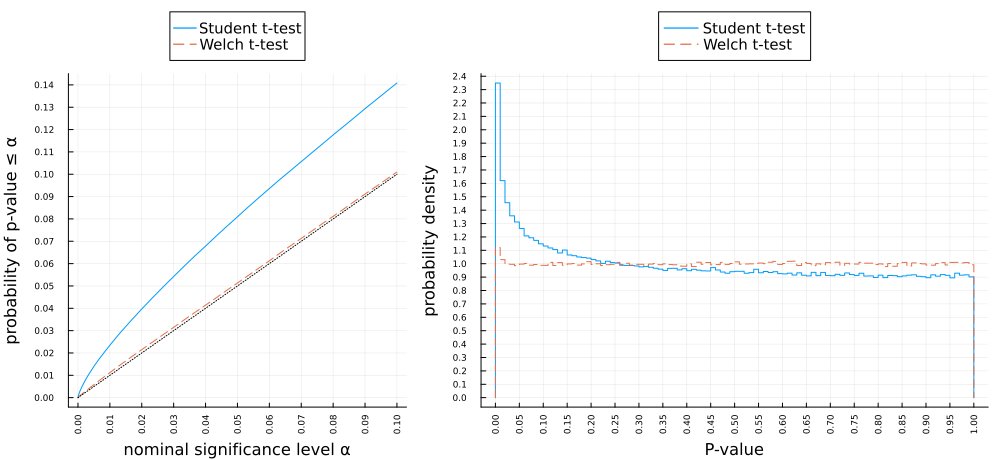

In [11]:
plot_t_tests(; distx = Normal(0, 3), disty = Normal(0, 1), m = 9, n = 11)

distx = Normal{Float64}(μ=0.0, σ=3.0)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 90
n = 110
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 3.0
std(disty) = 1.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 198
mean(DF_Welch) = 105.56695227893013
std(DF_Welch) = 3.375002383190172
ECDF(pval_Student, 0.05) = 0.071094
ECDF(pval_Welch, 0.05) = 0.049744
ECDF(pval_Student, 0.01) = 0.017985
ECDF(pval_Welch, 0.01) = 0.010068


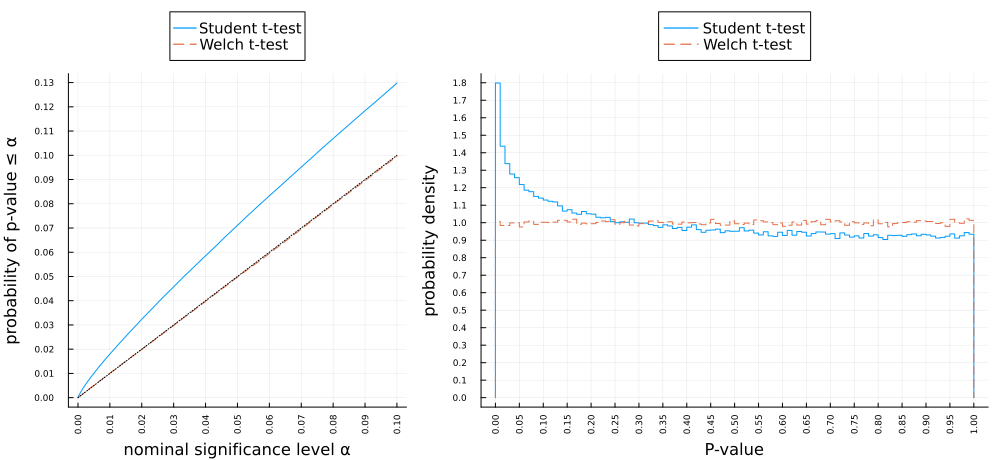

In [12]:
plot_t_tests(; distx = Normal(0, 3), disty = Normal(0, 1), m = 90, n = 110)

distx = Normal{Float64}(μ=0.0, σ=1.1)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 10
n = 50
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.1
std(disty) = 1.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 58
mean(DF_Welch) = 13.183607503261321
std(DF_Welch) = 2.99208264266166
ECDF(pval_Student, 0.05) = 0.065504
ECDF(pval_Welch, 0.05) = 0.051486
ECDF(pval_Student, 0.01) = 0.015515
ECDF(pval_Welch, 0.01) = 0.011353


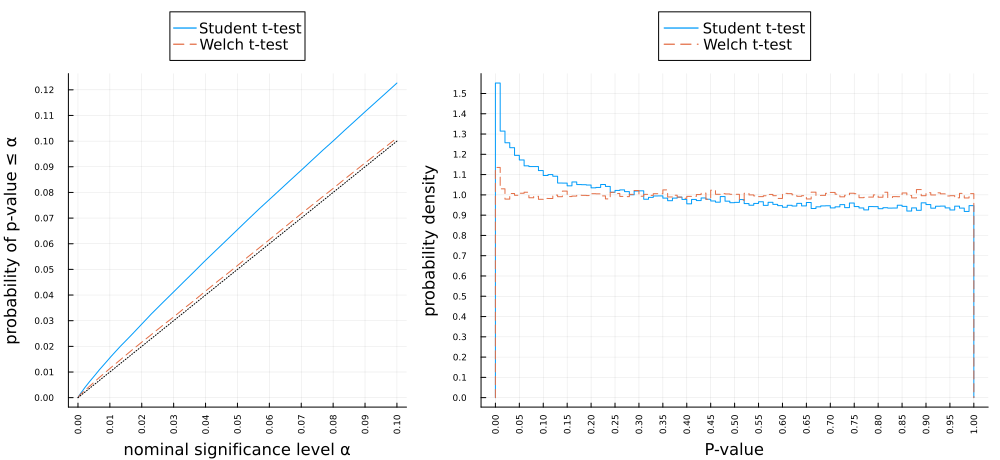

In [13]:
plot_t_tests(; distx = Normal(0, 1.1), disty = Normal(0, 1), m = 10, n = 50)

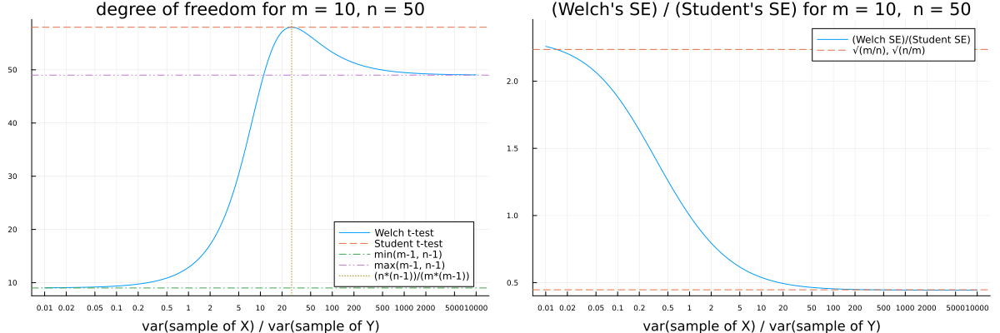

In [14]:
plot_df_and_SEratio(; m = 10, n = 50,
    tick = Any[0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100, 200, 500, 1000, 2000, 5000, 10000])

distx = Normal{Float64}(μ=0.0, σ=1.1)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 20
n = 100
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.1
std(disty) = 1.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 118
mean(DF_Welch) = 26.54751114465815
std(DF_Welch) = 3.2009945937625175
ECDF(pval_Student, 0.05) = 0.065619
ECDF(pval_Welch, 0.05) = 0.050336
ECDF(pval_Student, 0.01) = 0.015595
ECDF(pval_Welch, 0.01) = 0.010456


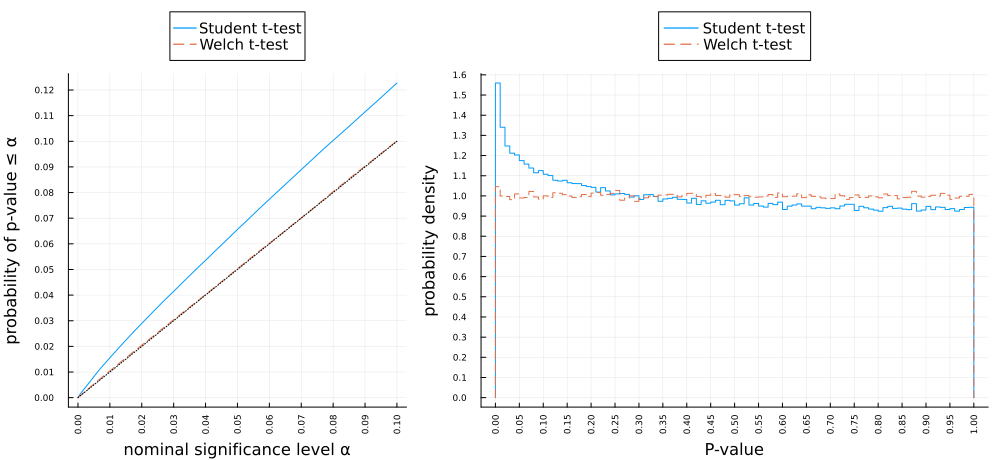

In [15]:
plot_t_tests(; distx = Normal(0, 1.1), disty = Normal(0, 1), m = 20, n = 100)

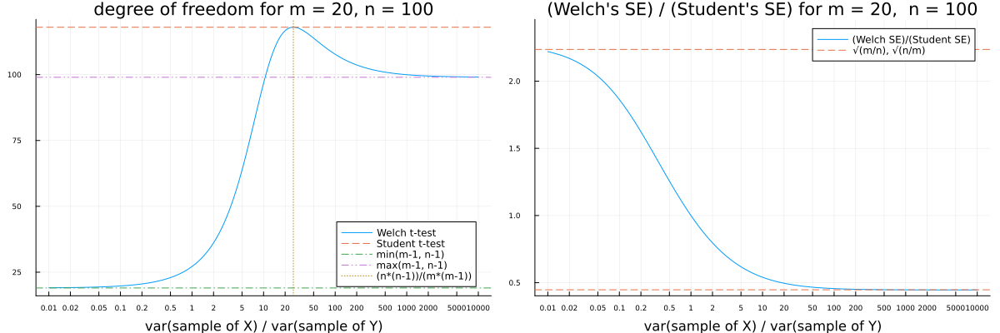

In [16]:
plot_df_and_SEratio(; m = 20, n = 100,
    tick = Any[0.01, 0.02, 0.05, 0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100, 200, 500, 1000, 2000, 5000, 10000])

distx = Normal{Float64}(μ=0.0, σ=1.2)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 10
n = 30
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.2
std(disty) = 1.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 38
mean(DF_Welch) = 14.68105150123741
std(DF_Welch) = 3.672715089852931
ECDF(pval_Student, 0.05) = 0.073009
ECDF(pval_Welch, 0.05) = 0.051497
ECDF(pval_Student, 0.01) = 0.018154
ECDF(pval_Welch, 0.01) = 0.011304


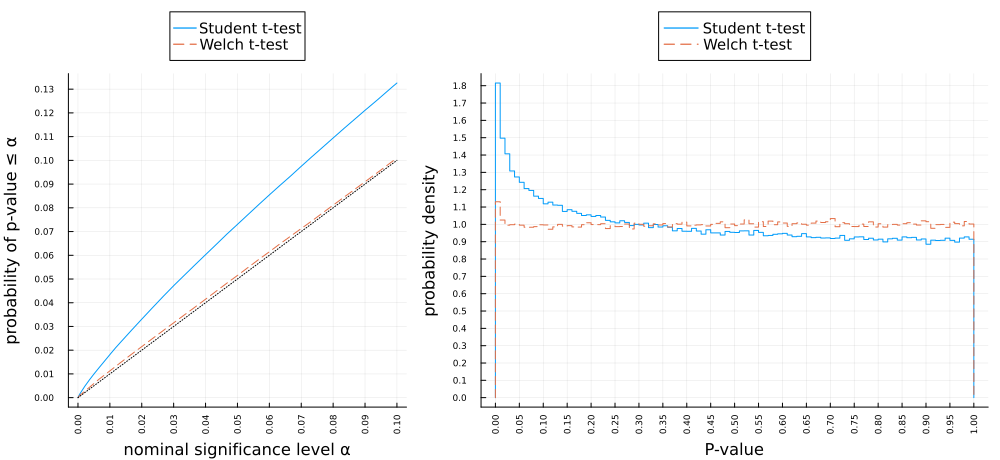

In [17]:
plot_t_tests(; distx = Normal(0, 1.2), disty = Normal(0, 1), m = 10, n = 30)

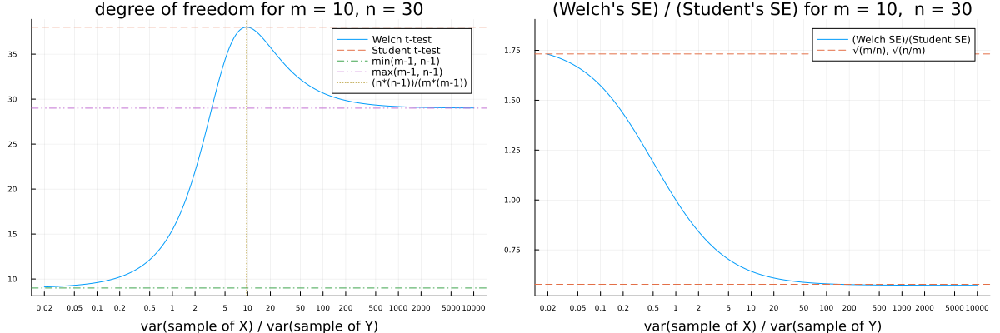

In [18]:
plot_df_and_SEratio(; m = 10, n = 30,
    tick = Any[0.02, 0.05, 0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100, 200, 500, 1000, 2000, 5000, 10000])

distx = Normal{Float64}(μ=0.0, σ=1.2)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 20
n = 60
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.2
std(disty) = 1.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 78
mean(DF_Welch) = 29.472184180733965
std(DF_Welch) = 4.424163396431349
ECDF(pval_Student, 0.05) = 0.073109
ECDF(pval_Welch, 0.05) = 0.05015
ECDF(pval_Student, 0.01) = 0.018323
ECDF(pval_Welch, 0.01) = 0.010268


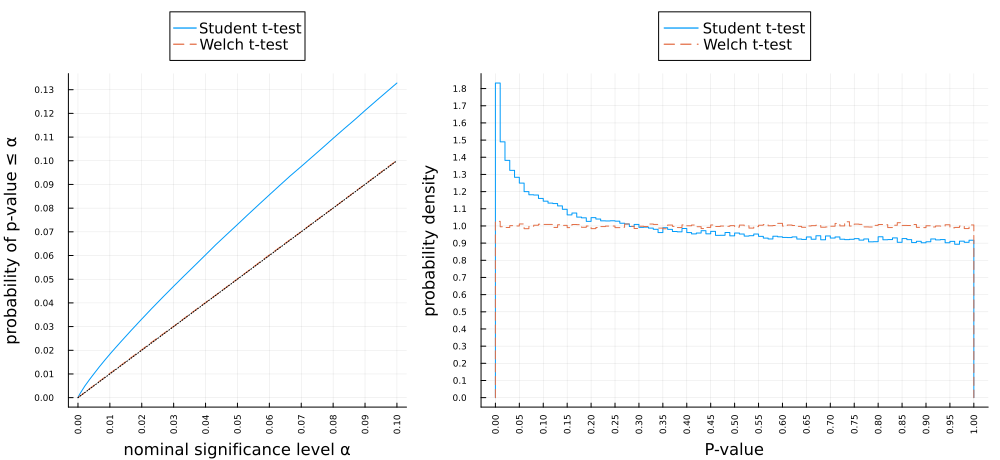

In [19]:
plot_t_tests(; distx = Normal(0, 1.2), disty = Normal(0, 1), m = 20, n = 60)

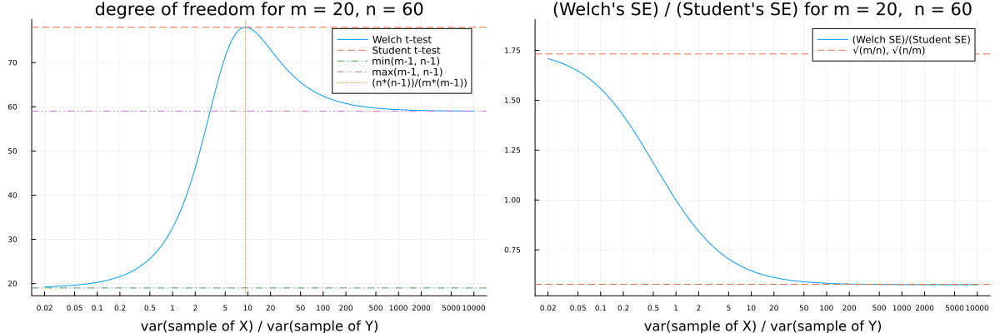

In [20]:
plot_df_and_SEratio(; m = 20, n = 60,
    tick = Any[0.02, 0.05, 0.1, 0.2, 0.5, 1, 2, 5, 10, 20, 50, 100, 200, 500, 1000, 2000, 5000, 10000])

distx = Normal{Float64}(μ=0.0, σ=1.2)
disty = Normal{Float64}(μ=0.0, σ=1.0)
m = 20
n = 60
s = 1
mean(distx) = 0.0
mean(disty) = 0.0
std(distx) = 1.2
std(disty) = 1.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 78
mean(DF_Welch) = 29.467717172971085
std(DF_Welch) = 4.422512937136371
ECDF(pval_Student, 0.05) = 0.073289
ECDF(pval_Welch, 0.05) = 0.04997
ECDF(pval_Student, 0.01) = 0.018493
ECDF(pval_Welch, 0.01) = 0.010316


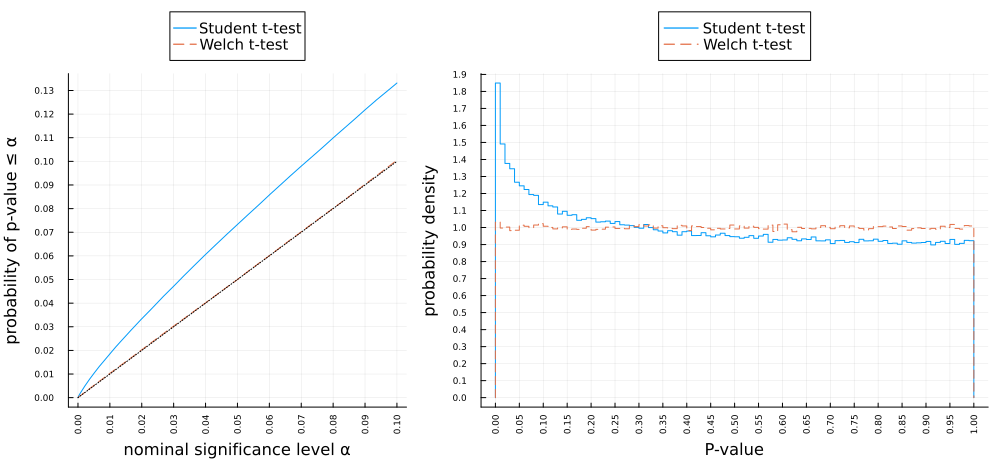

In [21]:
plot_t_tests(; distx = Normal(0, 1.2), disty = Normal(0, 1), m = 20, n = 60)

distx = Gamma{Float64}(α=1.0, θ=4.0)
disty = Gamma{Float64}(α=4.0, θ=1.0)
m = 100
n = 100
s = 1
mean(distx) = 4.0
mean(disty) = 4.0
std(distx) = 4.0
std(disty) = 2.0
T_Student ≈ T_Welch = true
(m + n) - 2 = 198
mean(DF_Welch) = 147.70634038807614
std(DF_Welch) = 13.525655307535663
ECDF(pval_Student, 0.05) = 0.053879
ECDF(pval_Welch, 0.05) = 0.053443
ECDF(pval_Student, 0.01) = 0.012916
ECDF(pval_Welch, 0.01) = 0.012737


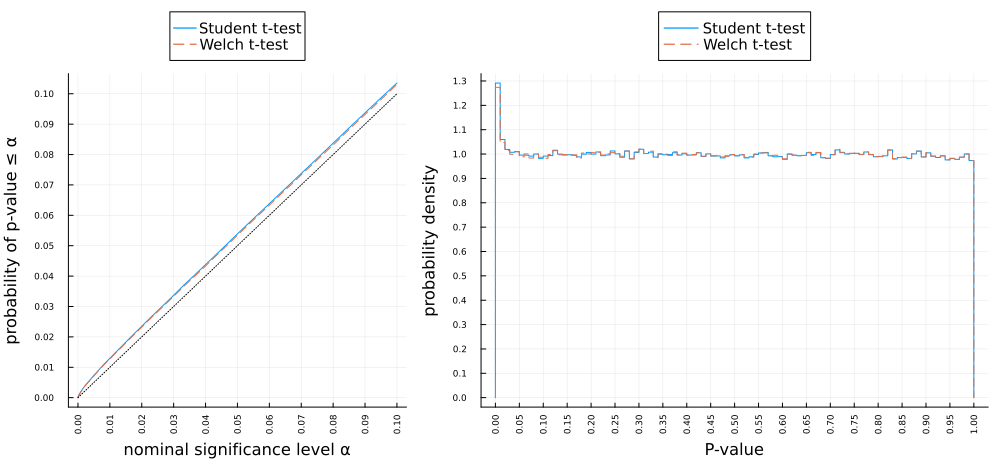

In [22]:
plot_t_tests(; distx = Gamma(1, 4), disty = Gamma(4, 1), m = 100, n = 100)

distx = Gamma{Float64}(α=1.0, θ=4.0)
disty = Gamma{Float64}(α=4.0, θ=1.0)
m = 90
n = 110
s = 1
mean(distx) = 4.0
mean(disty) = 4.0
std(distx) = 4.0
std(disty) = 2.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 198
mean(DF_Welch) = 127.38535970428896
std(DF_Welch) = 12.155214827003746
ECDF(pval_Student, 0.05) = 0.067944
ECDF(pval_Welch, 0.05) = 0.053959
ECDF(pval_Student, 0.01) = 0.018142
ECDF(pval_Welch, 0.01) = 0.013542


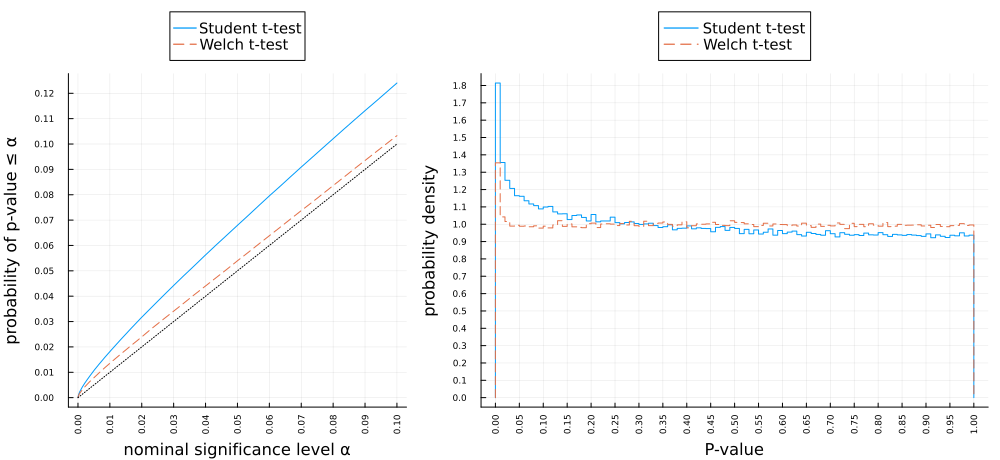

In [23]:
plot_t_tests(; distx = Gamma(1, 4), disty = Gamma(4, 1), m = 90, n = 110)

distx = Gamma{Float64}(α=1.0, θ=4.0)
disty = Gamma{Float64}(α=4.0, θ=1.0)
m = 80
n = 120
s = 1
mean(distx) = 4.0
mean(disty) = 4.0
std(distx) = 4.0
std(disty) = 2.0
T_Student ≈ T_Welch = false
(m + n) - 2 = 198
mean(DF_Welch) = 108.0497045810091
std(DF_Welch) = 10.123070886244568
ECDF(pval_Student, 0.05) = 0.085969
ECDF(pval_Welch, 0.05) = 0.056088
ECDF(pval_Student, 0.01) = 0.025635
ECDF(pval_Welch, 0.01) = 0.014888


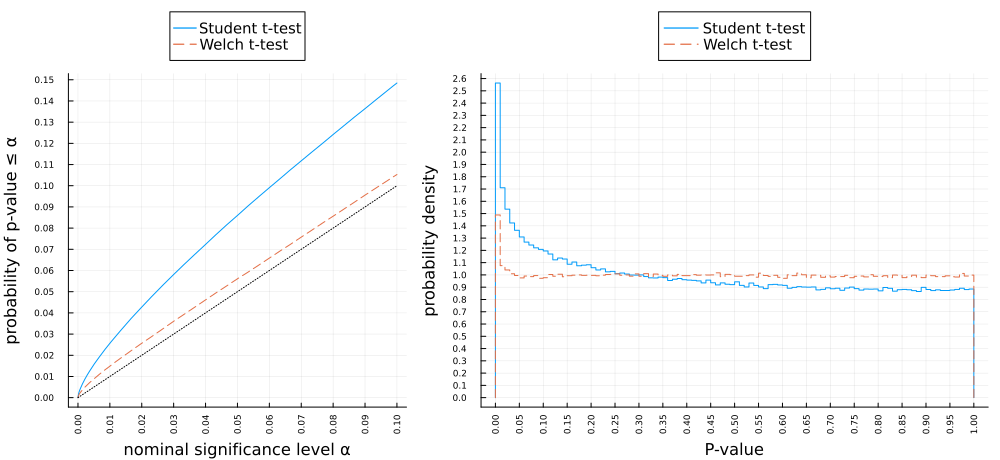

In [24]:
plot_t_tests(; distx = Gamma(1, 4), disty = Gamma(4, 1), m = 80, n = 120)

distx = LogNormal{Float64}(μ=0.1, σ=0.7)
disty = LogNormal{Float64}(μ=0.2, σ=0.7)
m = 1000
n = 1000
s = 1
mean(distx) = 1.411989919667659
mean(disty) = 1.5604901958326667
std(distx) = 1.1227905724784957
std(disty) = 1.2408754877927413
T_Student ≈ T_Welch = true
(m + n) - 2 = 1998
mean(DF_Welch) = 1962.640269792464
std(DF_Welch) = 41.198932788724576
ECDF(pval_Student, 0.05) = 0.80152
ECDF(pval_Welch, 0.05) = 0.80152
ECDF(pval_Student, 0.01) = 0.59204
ECDF(pval_Welch, 0.01) = 0.59202


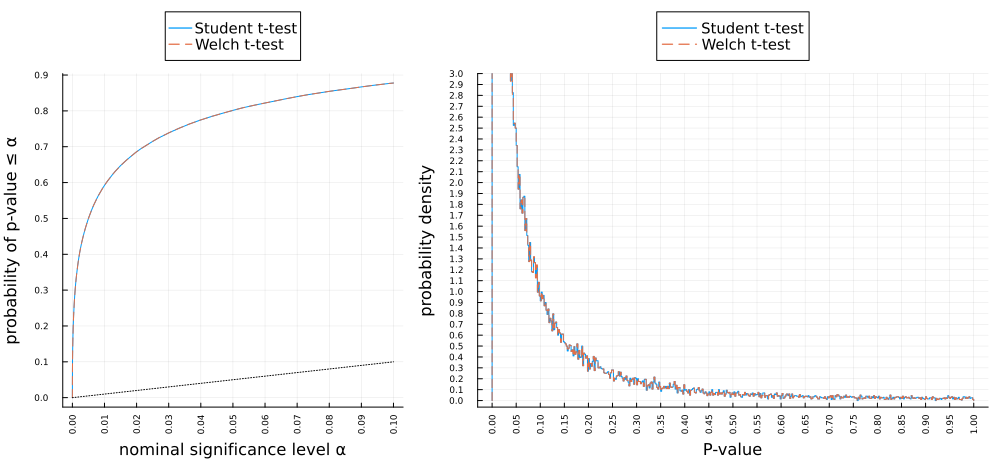

In [25]:
distx = LogNormal(0.1, 0.7)
disty = LogNormal(0.2, 0.7)
plot_t_tests(; distx, disty, m = 10^3, n = 10^3, L = 10^5, ytick=0:0.1:1, ylim=(-0.06, 3))

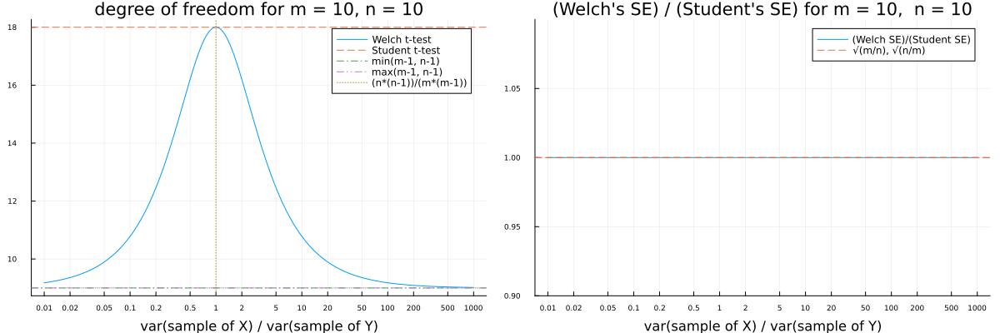

In [26]:
plot_df_and_SEratio(; m=10, n=10)

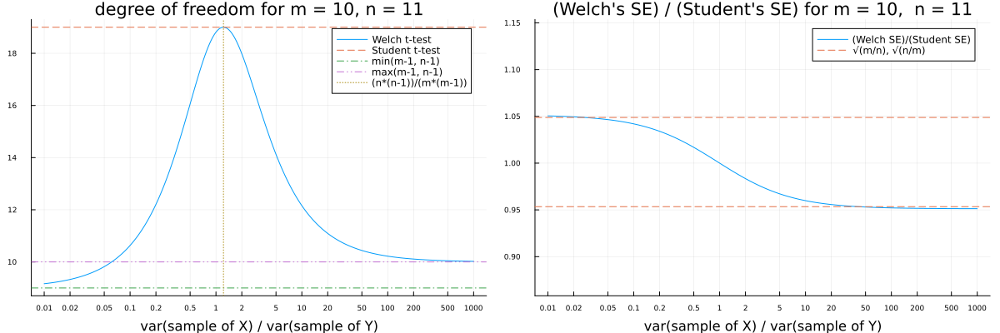

In [27]:
plot_df_and_SEratio(; m=10, n=11)

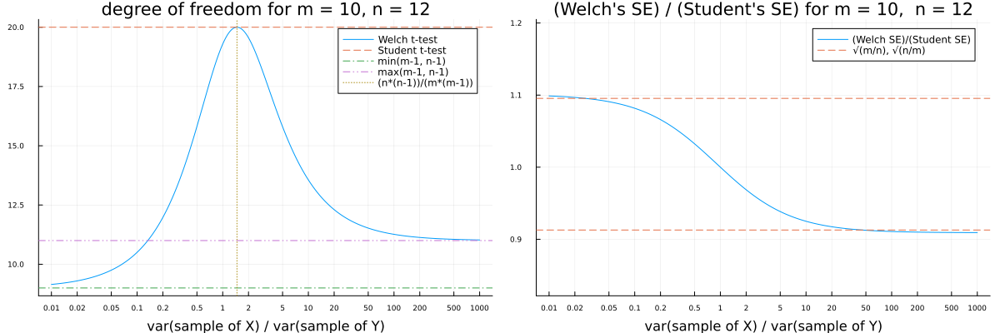

In [28]:
plot_df_and_SEratio(; m=10, n=12)

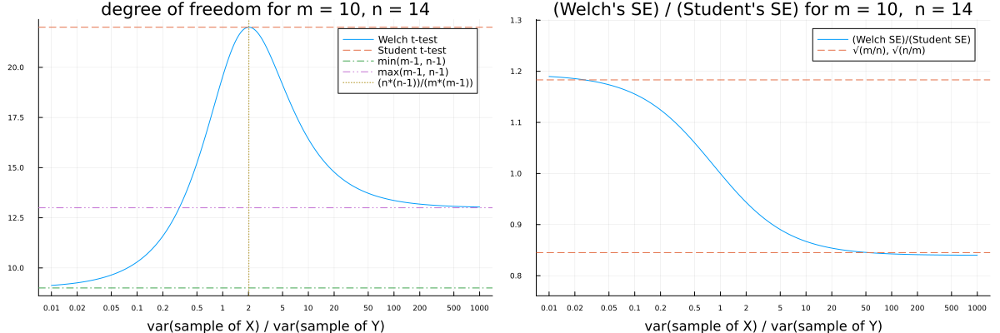

In [29]:
plot_df_and_SEratio(; m=10, n=14)

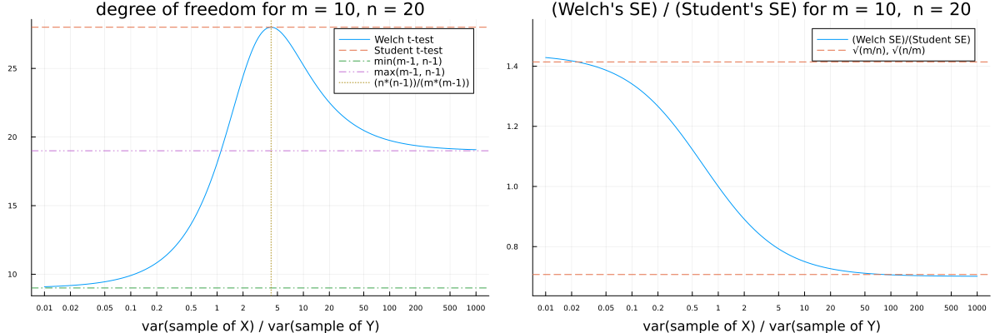

In [30]:
plot_df_and_SEratio(; m=10, n=20)

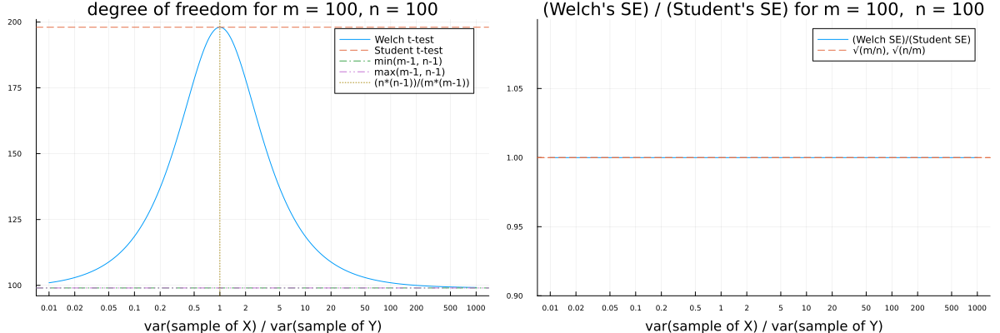

In [31]:
plot_df_and_SEratio(; m=100, n=100)

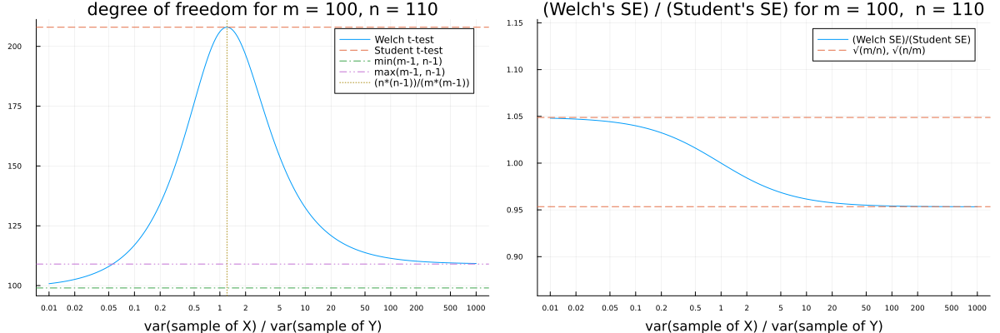

In [32]:
plot_df_and_SEratio(; m=100, n=110)

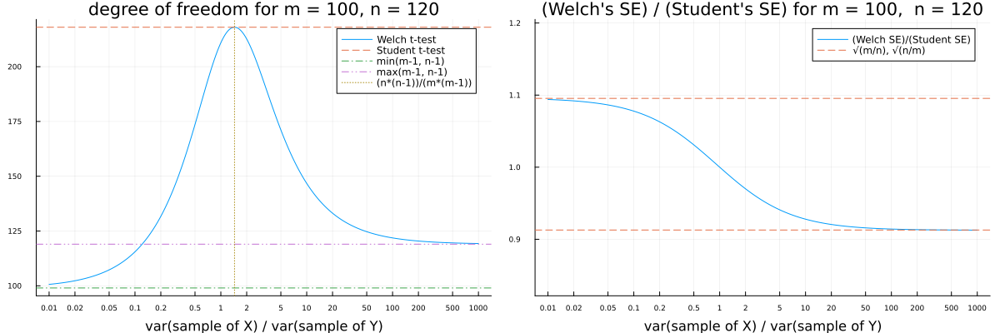

In [33]:
plot_df_and_SEratio(; m=100, n=120)

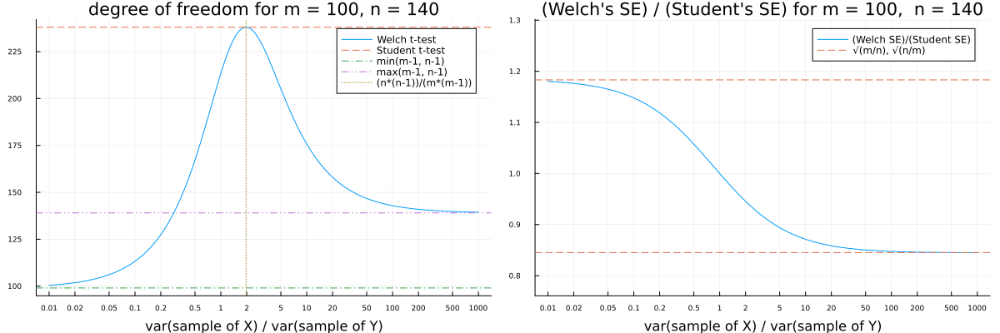

In [34]:
plot_df_and_SEratio(; m=100, n=140)

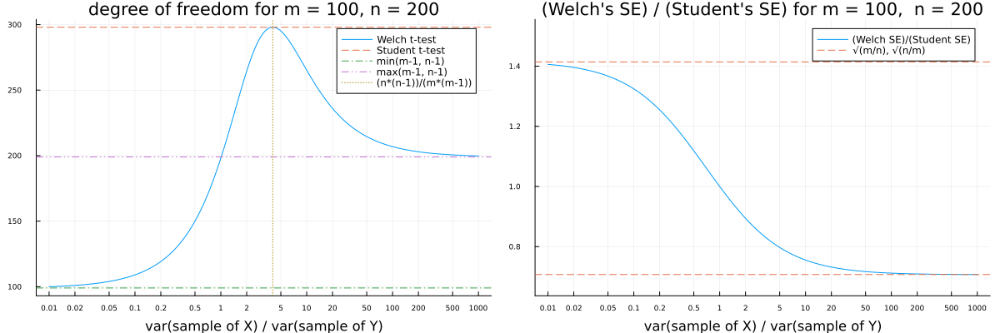

In [35]:
plot_df_and_SEratio(; m=100, n=200)